In [1]:
!pip freeze > ../requirements.txt

The process cannot access the file because it is being used by another process.


In [2]:
import os
import sys
sys.path.append(r'..')

import pandas as pd
from scripts.data_analysis import *
from scripts.visualization import *
from scripts.financial_analysis import *
from scripts.data_transformation import *

c:\Users\Darkles\10academy\10Academy-Kifiya-Week-1\env\Lib\site-packages\pyfolio\pos.py:25: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  warnings.warn(
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Darkles\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Darkles\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Darkles\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Darkles\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [3]:
datasets_folder = r"../datasets/raw/yfinance_data"
dataset_name = "META_historical_data.csv"
dataset_path = os.path.join(datasets_folder, dataset_name)

df_META = load_data(dataset_path)
# df_META['Date'] = pd.to_datetime(df_META['Date'])
df = clean_stock_data(df_META)
# df, _ = clean_and_preprocess_data(df, date_column="Date")
df

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
Date,,,,,,,,,
2012-12-12,2012-12-12,28.000000,28.139999,27.370001,27.580000,27.523441,46704200,0.0,0.0
2012-12-13,2012-12-13,27.590000,28.750000,27.430000,28.240000,28.182087,81051600,0.0,0.0
2012-12-14,2012-12-14,28.180000,28.330000,26.760000,26.809999,26.755020,91631600,0.0,0.0
2012-12-17,2012-12-17,26.770000,27.000000,26.320000,26.750000,26.695143,57742500,0.0,0.0
2012-12-18,2012-12-18,26.959999,27.910000,26.900000,27.709999,27.653173,60512900,0.0,0.0
...,...,...,...,...,...,...,...,...,...
2024-07-24,2024-07-24,472.309998,476.299988,460.579987,461.269989,461.269989,17649700,0.0,0.0
2024-07-25,2024-07-25,463.260010,463.549988,442.649994,453.410004,453.410004,18240500,0.0,0.0
2024-07-26,2024-07-26,464.200012,469.769989,459.420013,465.700012,465.700012,14222400,0.0,0.0


In [4]:
# Summarize the data
summary = summarize_data(df)

# Print the summary in a more presentable format
print("Dataset Summary:")
print(f"Shape: {summary['shape']}")
print("\nMissing Values:")
for column, missing in summary['missing_values'].items():
    print(f"{column}: {missing}")

print("\nDuplicates:")
print(summary['duplicates'])

print("\nUnique Values:")
for column, unique in summary['unique_values'].items():
    print(f"{column}: {unique}")

print("\nColumn Statistics:")
for column, stats in summary['column_stats'].items():
    print(f"\n{column}:")
    for stat, value in stats.items():
        print(f"  {stat}: {value}")

Dataset Summary:
Shape: (2926, 9)

Missing Values:
Date: 0
Open: 0
High: 0
Low: 0
Close: 0
Adj Close: 0
Volume: 0
Dividends: 0
Stock Splits: 0

Duplicates:
0

Unique Values:
Date: 2926
Open: 2738
High: 2748
Low: 2749
Close: 2777
Adj Close: 2778
Volume: 2918
Dividends: 2
Stock Splits: 1

Column Statistics:

Date:
  count: 2926
  mean: 2018-10-05 02:21:14.641148160
  min: 2012-12-12 00:00:00
  25%: 2015-11-06 18:00:00
  50%: 2018-10-03 12:00:00
  75%: 2021-08-30 18:00:00
  max: 2024-07-30 00:00:00
  std: nan

Open:
  count: 2926.0
  mean: 179.5572146795746
  min: 22.989999771118164
  25%: 97.7675018310547
  50%: 166.87000274658203
  75%: 231.45000457763672
  max: 542.3499755859375
  std: 108.86489515007986

High:
  count: 2926.0
  mean: 181.87533145234426
  min: 23.09000015258789
  25%: 98.77249908447266
  50%: 168.85000610351562
  75%: 234.93499755859375
  max: 542.8099975585938
  std: 110.25621874149991

Low:
  count: 2926.0
  mean: 177.31776149616775
  min: 22.670000076293945
  25%: 9

In [5]:
indicators = calculate_technical_indicators(df)

# [df.__setitem__(indicator, values) for indicator, values in indicators.items()]
for indicator, values in indicators.items():
    df[indicator] = values
df

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,SMA,...,MACD_Hist,WMA,BB_upper,BB_middle,BB_lower,ATR,ADX,CCI,ROC,MACD_hist
Date,,,,,,,,,,,,,,,,,,,,,
2012-12-12,2012-12-12,28.000000,28.139999,27.370001,27.580000,27.523441,46704200,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-12-13,2012-12-13,27.590000,28.750000,27.430000,28.240000,28.182087,81051600,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-12-14,2012-12-14,28.180000,28.330000,26.760000,26.809999,26.755020,91631600,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-12-17,2012-12-17,26.770000,27.000000,26.320000,26.750000,26.695143,57742500,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-12-18,2012-12-18,26.959999,27.910000,26.900000,27.709999,27.653173,60512900,0.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-24,2024-07-24,472.309998,476.299988,460.579987,461.269989,461.269989,17649700,0.0,0.0,502.223499,...,-5.276320,493.750380,546.666292,502.223499,457.780705,15.589090,20.738335,-142.852770,-13.731323,-5.276320
2024-07-25,2024-07-25,463.260010,463.549988,442.649994,453.410004,453.410004,18240500,0.0,0.0,499.237999,...,-6.029098,489.101476,548.149284,499.237999,450.326714,15.968440,22.373476,-162.711160,-11.564269,-6.029098
2024-07-26,2024-07-26,464.200012,469.769989,459.420013,465.700012,465.700012,14222400,0.0,0.0,496.545000,...,-5.375189,485.907382,546.601642,496.545000,446.488358,15.996408,23.388254,-107.343039,-6.649023,-5.375189


# Plotting indicators

In [6]:
plot_indicators(data=df, indicators=['RSI', 'MACD', 'MACD_Signal'], title='Technical Indicators')

In [7]:
plot_indicators(data=df, indicators=['SMA', 'RSI', 'EMA', 'MACD', 'MACD_Signal', 'WMA', 'BB_upper', 'BB_middle', 'BB_lower', 'ATR', 'ADX', 'CCI', 'ROC'], title='Technical Indicators')

In [8]:
plot_indicators(data=df, indicators=['SMA', 'EMA'], title='Simple Moving Average (SMA) vs Exponential Moving Average (EMA)')

In [9]:
plot_indicators(data=df, indicators=['RSI', 'ADX'], title='Relative Strength Index (RSI) vs Average Directional Index (ADX)')

In [10]:
plot_indicators(data=df, indicators=['BB_upper', 'BB_middle', 'BB_lower'], title='Bollinger Bands')

In [11]:
plot_indicators(data=df, indicators=['ATR', 'CCI'], title='Average True Range (ATR) vs Commodity Channel Index (CCI)')

In [12]:
plot_indicators(data=df, indicators=['ROC', 'MACD_hist'], title='Rate of Change (ROC) vs MACD Histogram')

In [13]:
plot_indicators(data=df, indicators = ['MACD', 'MACD_Signal'], title = 'Moving Average Convergence Divergence (MACD)')

In [14]:
plot_indicators(data=df, indicators=['SMA', 'WMA'], title='Simple Moving Average (SMA) vs Weighted Moving Average (WMA)')

In [15]:
plot_indicators(data=df, indicators=['MACD', 'MACD_Signal', 'MACD_hist'], title='MACD vs MACD Signal vs MACD Histogram')

In [16]:
plot_indicators(data=df, indicators=['BB_upper', 'BB_middle', 'BB_lower', 'Close'], title='Bollinger Bands with Close Price')

In [17]:
plot_indicators(data=df, indicators=['ATR', 'Close'], title='Average True Range (ATR) with Close Price')

In [18]:
plot_indicators(data=df, indicators=['CCI', 'Close'], title='Commodity Channel Index (CCI) with Close Price')

In [19]:
plot_indicators(data=df, indicators=['ROC', 'Close'], title='Rate of Change (ROC) with Close Price')

In [20]:
plot_indicators(data=df, indicators=['SMA', 'EMA', 'WMA'], title='Moving Averages (SMA, EMA, WMA)')

In [21]:
plot_indicators(data=df, indicators=['RSI', 'CCI'], title='Relative Strength Index (RSI) vs Commodity Channel Index (CCI)')

In [22]:
plot_indicators(data=df, indicators=['MACD', 'MACD_Signal', 'MACD_hist'], title='MACD vs MACD Signal vs MACD Histogram')

In [23]:
plot_indicators(data=df, indicators=['BB_upper', 'BB_middle', 'BB_lower', 'Close'], title='Bollinger Bands with Close Price')

In [24]:
plot_indicators(data=df, indicators=['ATR', 'Close'], title='Average True Range (ATR) with Close Price')

In [25]:
plot_indicators(data=df, indicators=['ADX', 'Close'], title='Average Directional Index (ADX) with Close Price')

In [26]:
plot_indicators(data=df, indicators=['ROC', 'Close'], title='Rate of Change (ROC) with Close Price')

# Additional

In [27]:
plot_interactive_stock_chart(df, 'Open')

In [28]:
plot_stock_data(df)

In [29]:
plot_stock_data_2(df)

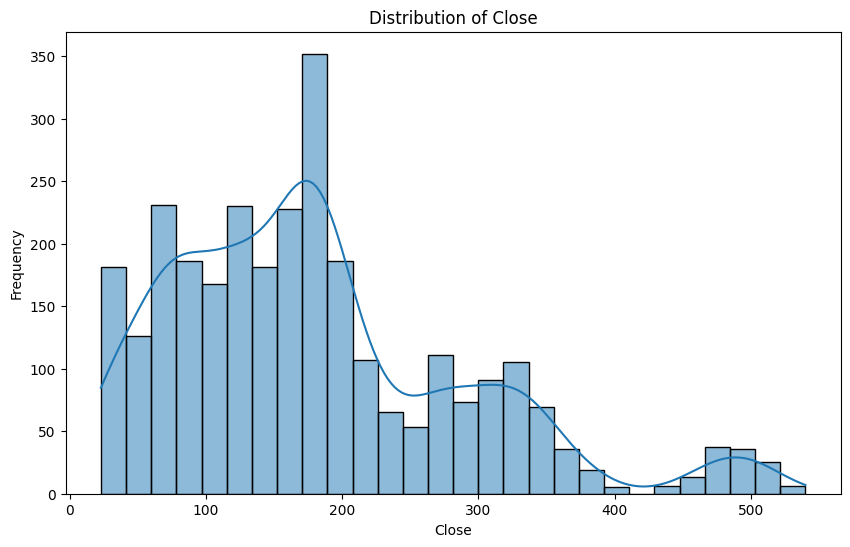

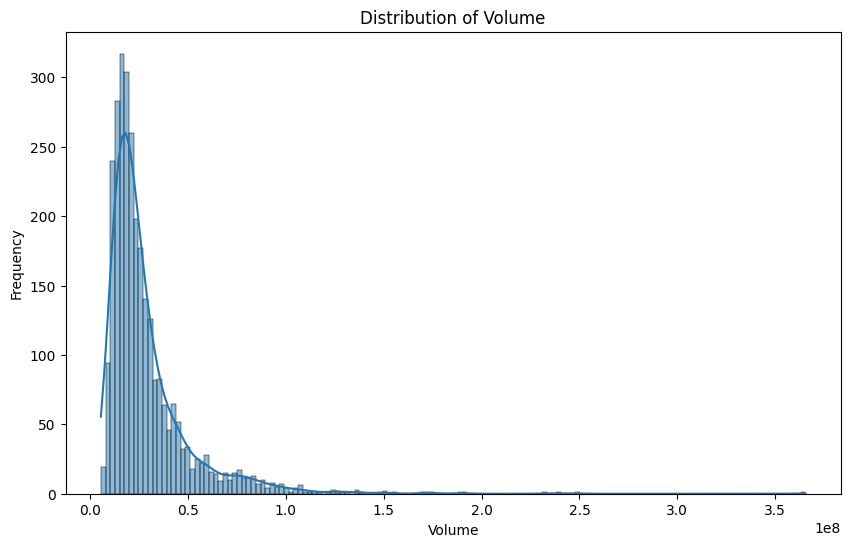

In [30]:
# Plot distributions
plot_distributions(df)

c:\Users\Darkles\10academy\10Academy-Kifiya-Week-1\env\Lib\site-packages\empyrical\stats.py:1424: RuntimeWarning:

divide by zero encountered in scalar divide

c:\Users\Darkles\10academy\10Academy-Kifiya-Week-1\env\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '5.055%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2012-12-12
End date,2024-07-30
Total months,139
,Backtest
Annual return,5.055%
Cumulative returns,77.285%
Annual volatility,15.059%
Sharpe ratio,0.40
Calmar ratio,0.18
Stability,0.85
Max drawdown,-27.99%


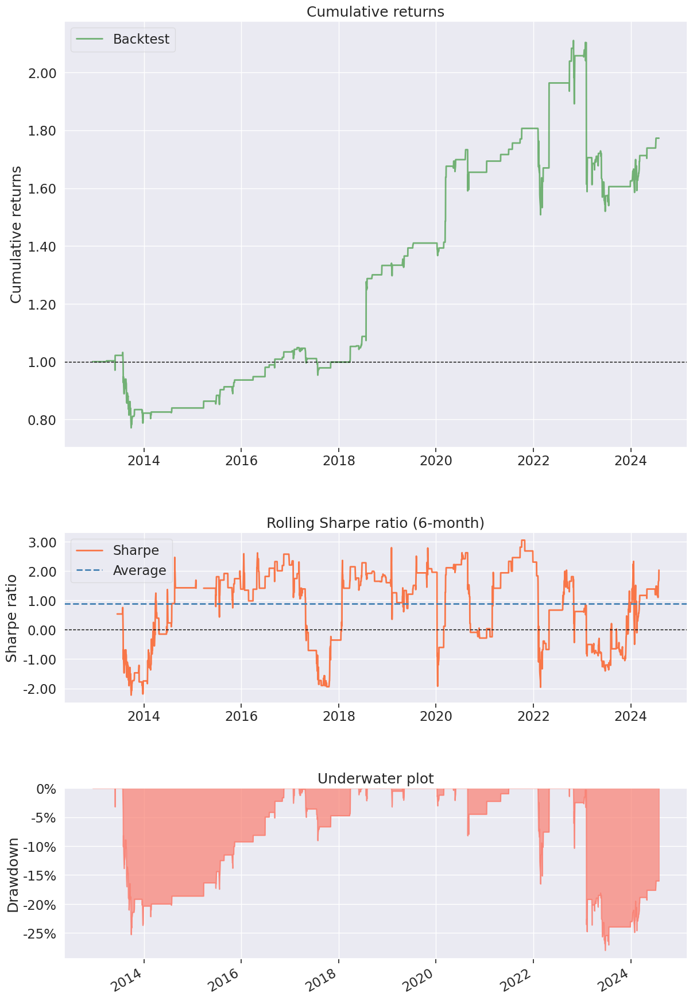

In [31]:
df['Signal'] = generate_signals(df)
df['Daily_Return'] = calculate_daily_return(df)
df['Strategy_Return'] = calculate_strategy_return(df)

create_performance_tear_sheet(df['Strategy_Return'])

In [32]:
# Calculate correlations
correlations = calculate_correlations(df, method="pearson")
correlations

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,SMA,...,BB_middle,BB_lower,ATR,ADX,CCI,ROC,MACD_hist,Signal,Daily_Return,Strategy_Return
Date,1.000000,0.842673,0.844847,0.841594,0.843139,0.842969,-0.353943,0.043146,NaN,0.843594,...,0.843594,0.825401,0.858519,0.057935,-0.014163,-0.036435,-0.011682,0.024857,-0.009677,0.010963
Open,0.842673,1.000000,0.999774,0.999747,0.999491,0.999492,-0.391211,0.073289,NaN,0.994984,...,0.994984,0.992720,0.853324,0.004150,0.063539,0.013628,-0.039570,-0.021571,-0.009061,0.011665
High,0.844847,0.999774,1.000000,0.999713,0.999768,0.999768,-0.387068,0.072644,NaN,0.995081,...,0.995081,0.992451,0.856894,0.005029,0.064432,0.014947,-0.038825,-0.022889,-0.000181,0.010485
Low,0.841594,0.999747,0.999713,1.000000,0.999779,0.999778,-0.395943,0.073952,NaN,0.994484,...,0.994484,0.992438,0.849757,0.003799,0.070391,0.018807,-0.035004,-0.025034,0.000767,0.010402
Close,0.843139,0.999491,0.999768,0.999779,1.000000,0.999999,-0.391652,0.073603,NaN,0.994639,...,0.994639,0.992322,0.853032,0.004485,0.069660,0.019349,-0.035459,-0.026214,0.010166,0.010186
Adj Close,0.842969,0.999492,0.999768,0.999778,0.999999,1.000000,-0.391539,0.073733,NaN,0.994650,...,0.994650,0.992337,0.853036,0.004477,0.069618,0.019298,-0.035618,-0.026182,0.010146,0.010192
Volume,-0.353943,-0.391211,-0.387068,-0.395943,-0.391652,-0.391539,1.000000,-0.019719,NaN,-0.374913,...,-0.374913,-0.393270,-0.176101,0.183784,-0.063163,0.029831,-0.061392,-0.058768,0.044132,-0.031809
Dividends,0.043146,0.073289,0.072644,0.073952,0.073603,0.073733,-0.019719,1.000000,NaN,0.069518,...,0.069518,0.064066,0.052633,0.019506,0.010913,0.015395,0.024255,0.005443,-0.005542,-0.000665
Stock Splits,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SMA,0.843594,0.994984,0.995081,0.994484,0.994639,0.994650,-0.374913,0.069518,NaN,1.000000,...,1.000000,0.996251,0.869768,-0.003253,-0.005364,-0.057488,-0.118896,0.027829,-0.022274,0.017276


In [33]:
# Detect outliers
outliers = detect_outliers(df, column="Close", method="iqr")
outliers

,Date,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,SMA,...,BB_middle,BB_lower,ATR,ADX,CCI,ROC,MACD_hist,Signal,Daily_Return,Strategy_Return
Date,,,,,,,,,,,,,,,,,,,,,
2024-02-02,2024-02-02,459.600006,485.959991,453.010010,474.989990,474.015930,84615500,0.0,0.0,384.203502,...,384.203502,333.899520,14.552899,36.080690,343.140413,23.872728,5.249674,-1,0.203176,0.000000
2024-02-05,2024-02-05,469.880005,471.899994,459.220001,459.410004,458.467865,40832400,0.0,0.0,389.576501,...,389.576501,331.799688,14.639834,38.504982,251.074694,20.333701,6.793968,-1,-0.032801,0.032801
2024-02-06,2024-02-06,464.000000,467.119995,453.000000,454.720001,453.787506,21655200,0.0,0.0,394.379501,...,394.379501,331.901873,14.602703,40.188540,190.271937,18.047764,6.966407,-1,-0.010209,0.010209
2024-02-07,2024-02-07,458.000000,471.519989,456.179993,469.589996,468.626984,23066000,0.0,0.0,399.987502,...,399.987502,331.899868,14.759652,41.844975,167.930928,20.191958,7.502350,-1,0.032701,-0.032701
2024-02-08,2024-02-08,468.320007,470.589996,465.029999,470.000000,469.036163,18815100,0.0,0.0,404.964001,...,404.964001,331.868468,14.102534,43.383094,140.057091,19.538127,7.298133,-1,0.000873,-0.000873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-07-24,2024-07-24,472.309998,476.299988,460.579987,461.269989,461.269989,17649700,0.0,0.0,502.223499,...,502.223499,457.780705,15.589090,20.738335,-142.852770,-13.731323,-5.276320,0,-0.056109,-0.000000
2024-07-25,2024-07-25,463.260010,463.549988,442.649994,453.410004,453.410004,18240500,0.0,0.0,499.237999,...,499.237999,450.326714,15.968440,22.373476,-162.711160,-11.564269,-6.029098,0,-0.017040,-0.000000
2024-07-26,2024-07-26,464.200012,469.769989,459.420013,465.700012,465.700012,14222400,0.0,0.0,496.545000,...,496.545000,446.488358,15.996408,23.388254,-107.343039,-6.649023,-5.375189,0,0.027106,0.000000


In [34]:
# Time-based aggregation
time_based_aggregation(df, time_column="Date", agg_column="Close", freq="ME", agg_func="mean")

,Date,Close
0,2012-12-31,26.933846
1,2013-01-31,30.331905
2,2013-02-28,28.087895
3,2013-03-31,26.806500
4,2013-04-30,26.608182
...,...,...
135,2024-03-31,497.710498
136,2024-04-30,491.844550
137,2024-05-31,467.769092
138,2024-06-30,500.654737
